# Open NCEP R1 aggregated with xarray

## Make time-lon plots, with Africa in the center 

In [98]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np

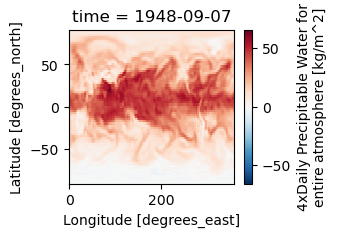

In [157]:
# PW dataset (pr_wtr)

dsPW = xr.open_dataset('http://psl.noaa.gov/thredds/dodsC/Aggregations/ncep.reanalysis/surface/pr_wtr.eatm.nc')
dsPW.pr_wtr[250*4].plot(size=2) # West coast is 125W = 360-125 = 235

In [ ]:
# Reanalysis aggregations at NOAA PSL/PSD lab: 
# https://psl.noaa.gov/thredds/catalog/catalog.html

# URL = 'http://psl.noaa.gov/thredds/dodsC/Aggregations/ncep.reanalysis/pressure/uwnd.nc' # u only
URL = 'http://psl.noaa.gov/thredds/dodsC/Aggregations/ncep.reanalysis/pressure/aggwnd.nc' #u,v,w
URL = 'http://psl.noaa.gov/thredds/dodsC/Aggregations/ncep.reanalysis/pressure/aggvars.nc' # thermo too 
ds = xr.open_dataset(URL)

In [5]:
ds

<xarray.Dataset> Size: 488GB
Dimensions:  (level: 17, lat: 73, lon: 144, time: 112692)
Coordinates:
  * level    (level) float32 68B 1e+03 925.0 850.0 700.0 ... 50.0 30.0 20.0 10.0
  * lat      (lat) float32 292B 90.0 87.5 85.0 82.5 ... -82.5 -85.0 -87.5 -90.0
  * lon      (lon) float32 576B 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) datetime64[ns] 902kB 1948-01-01 ... 2025-02-17T18:00:00
Data variables:
    air      (time, level, lat, lon) float32 81GB ...
    hgt      (time, level, lat, lon) float32 81GB ...
    uwnd     (time, level, lat, lon) float32 81GB ...
    vwnd     (time, level, lat, lon) float32 81GB ...
    omega    (time, level, lat, lon) float32 81GB ...
    rhum     (time, level, lat, lon) float32 81GB ...
    slp      (time, lat, lon) float32 5GB ...
Attributes:
    Conventions:    COARDS
    title:          4x daily NMC reanalysis (2014)
    history:        created 2022/12 by Hoop (netCDF2.3)
    description:    Data is from NMC initialized reanalysis\n(4x/day).  It co...
    platform:       Model
    dataset_title:  NCEP-NCAR Reanalysis 1
    References:     http://www.psl.noaa.gov/data/gridded/data.ncep.reanalysis...

In [212]:
# Latitude-level standard deviation plot 
Tstd = ds.air[0:120].std(dim=['time','lon'])

(1020.0, 100.0)

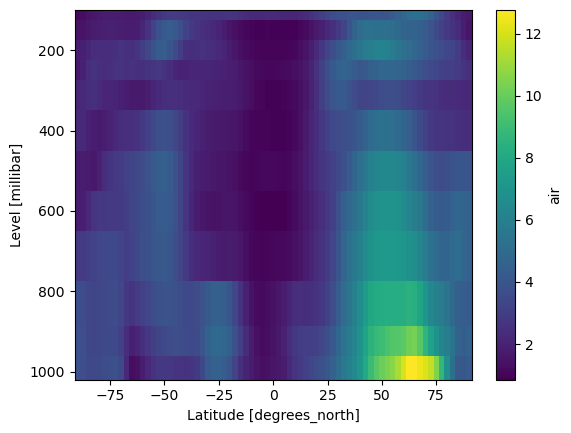

In [215]:
Tstd.plot(); plt.ylim([1020,100])

In [216]:
Tstdt = ds.air[0:120].std(dim=['time'])

(1020.0, 100.0)

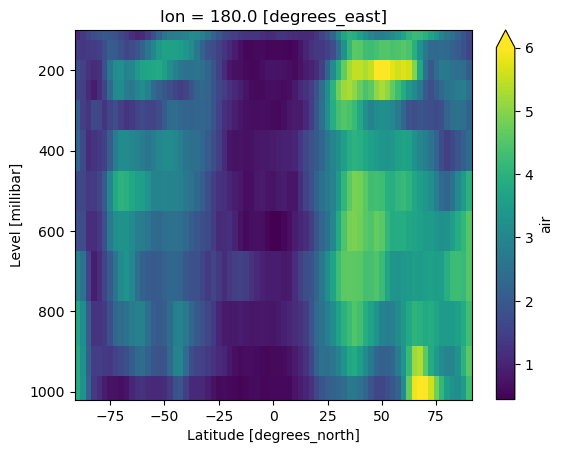

In [236]:
Tstdt.sel(lon=180).plot(vmax=6); plt.ylim([1020,100])

In [217]:
Tstd

<xarray.DataArray 'air' (level: 17, lat: 73)> Size: 5kB
array([[4.294308 , 4.096073 , 4.1907177, ..., 3.4434848, 3.6788654,
        3.828539 ],
       [4.57228  , 4.3506517, 4.5592813, ..., 3.3879523, 3.664261 ,
        3.8344724],
       [4.2948494, 4.31743  , 4.463144 , ..., 3.3329408, 3.5664308,
        3.705015 ],
       ...,
       [3.52736  , 3.7533228, 4.307266 , ..., 1.7741646, 1.7169969,
        1.6659722],
       [4.3904905, 4.6115866, 5.1590075, ..., 1.8376883, 1.8123407,
        1.7963754],
       [6.148195 , 6.349663 , 6.885816 , ..., 1.968652 , 2.0224373,
        2.0095127]], dtype=float32)
Coordinates:
  * level    (level) float32 68B 1e+03 925.0 850.0 700.0 ... 50.0 30.0 20.0 10.0
  * lat      (lat) float32 292B 90.0 87.5 85.0 82.5 ... -82.5 -85.0 -87.5 -90.0

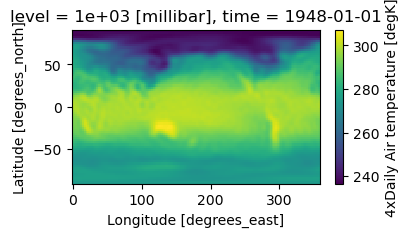

In [59]:
ds.air[0][0].plot(size=2, aspect=2)

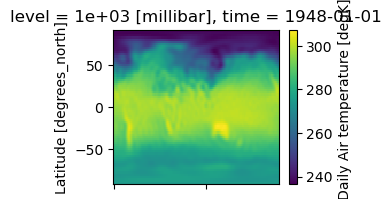

In [142]:
# Rolling the array by 40*2.5 degrees = 100 degrees puts N America W and E coasts at edges

ds.air[0][0].roll(lon=40, roll_coords=False).plot(size=2)
plt.gca().set_xticklabels([])  # Turn off x-axis labels
plt.gca().set_xlabel('');  # Remove x-axis label

## Strings for a date range 
time=slice(yyyy1-mm1-dd1, yyyy2-mm2-dd2)

In [171]:
yyyy1 = '2024-'  # Year 1 
mm1 = '07-'      # Month 1: 
dd1 = '01'

yyyy2 = '2024-'
mm2 = '10-'
dd2 = '31'

fields = ['rhum','vwnd']
mylevel = 300 

latS = 0
latN = 25

In [172]:
# Build a time-lon dataset and roll the longitudes for display 

slab = ds[fields].sel(time = slice(yyyy1+mm1+dd1, yyyy2+mm2+dd2), lat = slice(latN, latS), level=mylevel)
timelon = slab.mean('lat')  #.plot(size=7, aspect=0.5)

# Roll the data to shift the longitude

NumRollgrids = 40
ds_rolled = timelon.roll(lon=NumRollgrids, roll_coords=True)

# Adjust the longitude coordinates, subtract 360 from the rolled ones

leftlons = ds_rolled.lon[0:NumRollgrids].values -360
ritelons = ds_rolled.lon[NumRollgrids:].values
newlons = np.concatenate( (leftlons,ritelons) )
ds_rolled['lon'] = newlons

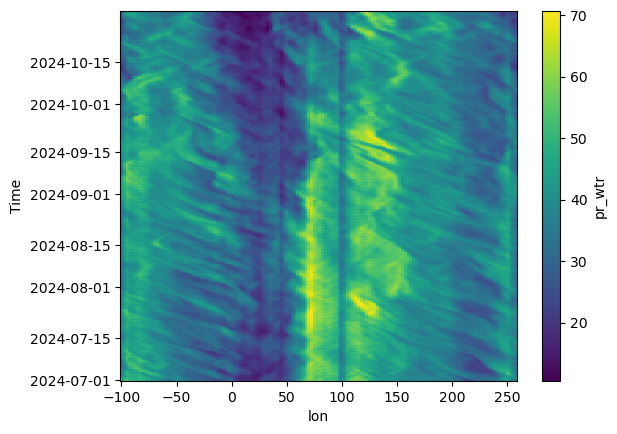

In [173]:
PW_ATL = dsPW.pr_wtr.sel(time = slice(yyyy1+mm1+dd1, yyyy2+mm2+dd2), lat = slice(30,15))
dsPW_rolled = PW_ATL.roll(lon=NumRollgrids, roll_coords=True)
dsPW_rolled['lon'] = newlons
dsPW_rolled.mean('lat').plot()

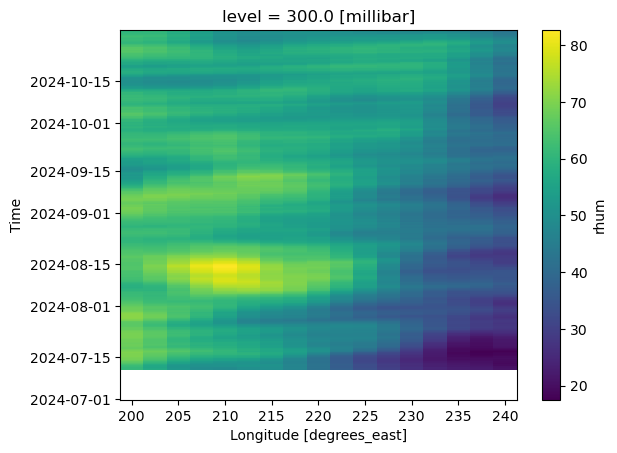

In [202]:
RHmid_smoo.plot() #(cmap='jet',alpha=0.5)

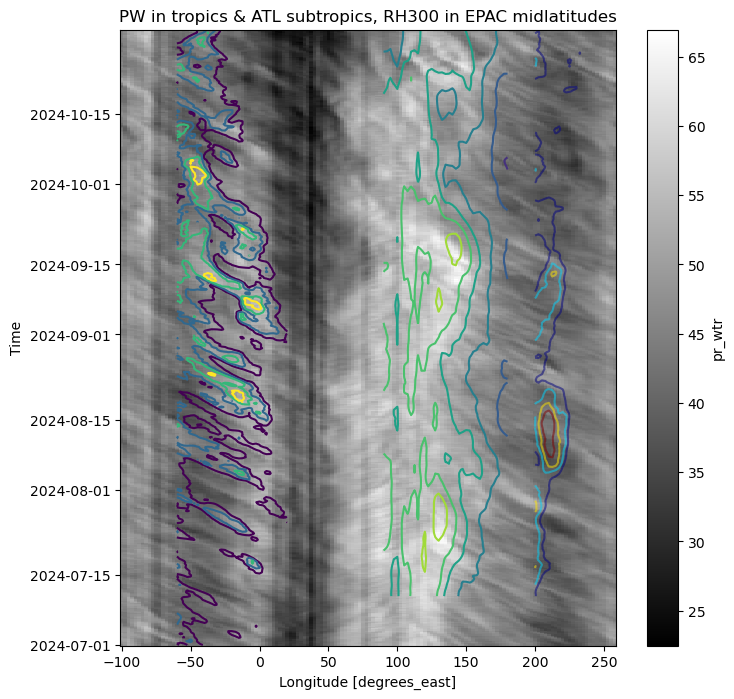

In [205]:
# Plot background in gray scales: 
# RH300 or PW? Here is the former
#ds_rolled.rhum.plot(cmap='gray', size=8,aspect=1)
#plt.title('rhum300 latitudes '+str(latS)+'-'+str(latN));

PW_tropics = dsPW.pr_wtr.sel(time = slice(yyyy1+mm1+dd1, yyyy2+mm2+dd2), lat = slice(20,0))
dsPW_rolled = PW_tropics.roll(lon=NumRollgrids, roll_coords=True)
dsPW_rolled['lon'] = newlons
tropicalPW = dsPW_rolled.mean('lat')
tropicalPW.plot(cmap='gray',size=8,aspect=1)

# Overplot time-smoothed version of same data 
tropicalPW.rolling(time=40).mean().sel(lon=slice(90,180)).plot.contour()


# Overplot PW in the Atlantic subtropics, have to roll longitude and pick 60W-20
PW_subtropics = dsPW.pr_wtr.sel(time = slice(yyyy1+mm1+dd1, yyyy2+mm2+dd2), lat = slice(30,15))
dsPW_rolled = PW_subtropics.roll(lon=NumRollgrids, roll_coords=True)
dsPW_rolled['lon'] = newlons
dsPW_rolled.sel(lon=slice(-60,20)).mean('lat').plot.contour(levels=[35,40,45,50])


# Overplot PW in the EPAC midlatitudes (ARs)
PW_midlats = dsPW.pr_wtr.sel(time = slice(yyyy1+mm1+dd1, yyyy2+mm2+dd2), lat = slice(60,30))
#PW_midlats.sel(lon=slice(70,240)).mean('lat').plot.contour(levels=[30,35,40,45])

# No actually, rh300 in midlatitudes 
RH_midlats = ds.rhum.sel(time = slice(yyyy1+mm1+dd1, yyyy2+mm2+dd2), lat = slice(50,30), level=300)
RHmid_smoo = RH_midlats.sel(lon=slice(200,240)).mean('lat').rolling(time=40).mean()
RHmid_smoo.plot.contour(levels=[60,65,70,75], cmap='jet', alpha=0.5)

plt.title('PW in tropics & ATL subtropics, RH300 in EPAC midlatitudes');

In [206]:
plt.close()

## Loop over all years

In [207]:
years = np.arange(2000,2024)
years

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021,
       2022, 2023])

2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020


/opt/miniconda3/envs/ATM651/lib/python3.10/site-packages/xarray/plot/utils.py:478: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  _, ax = plt.subplots(figsize=figsize, subplot_kw=subplot_kws)


2021
2022
2023


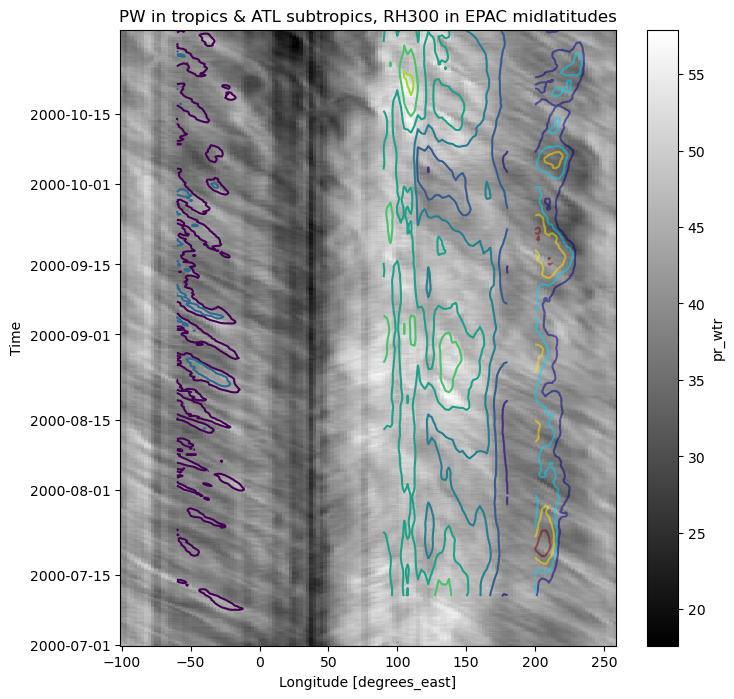

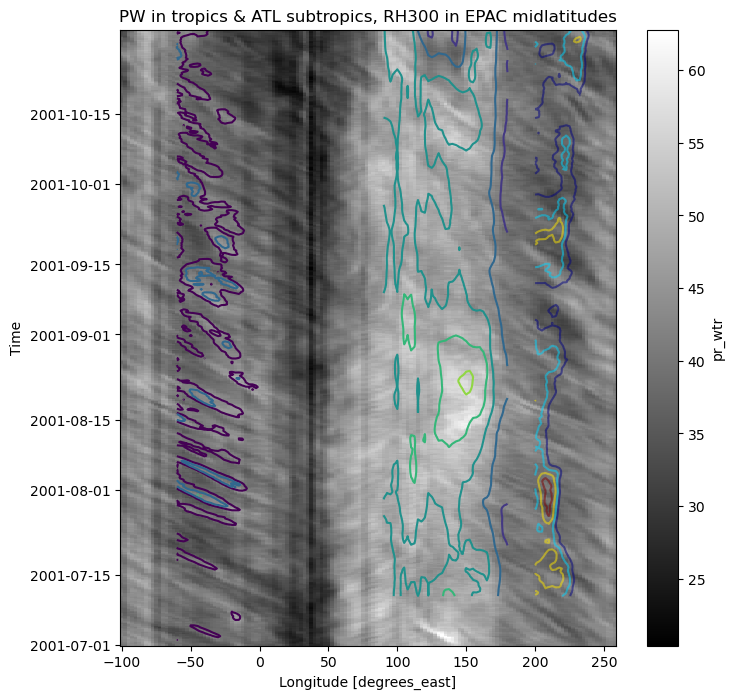

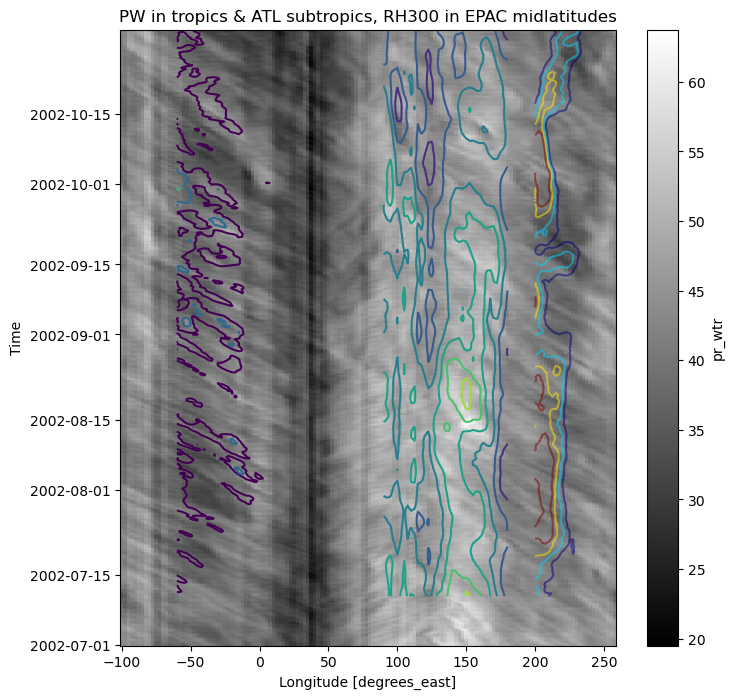

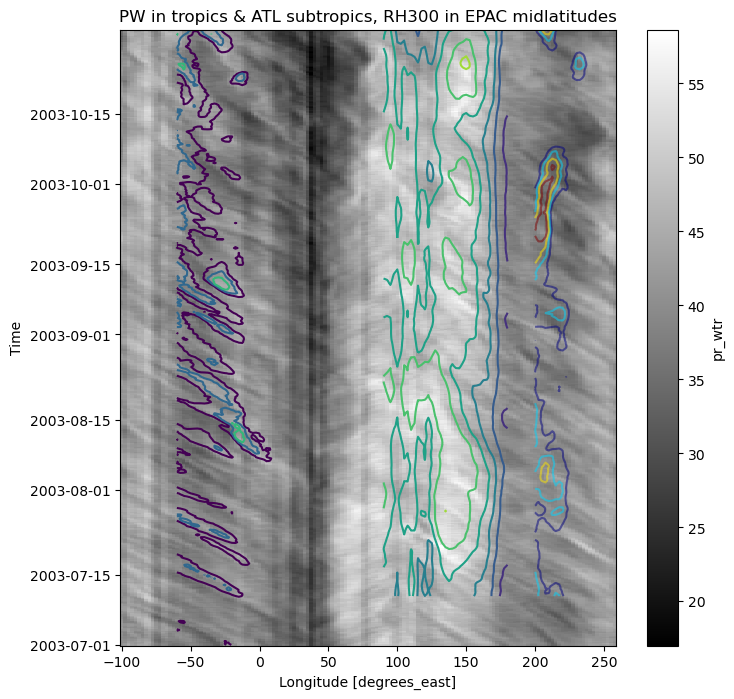

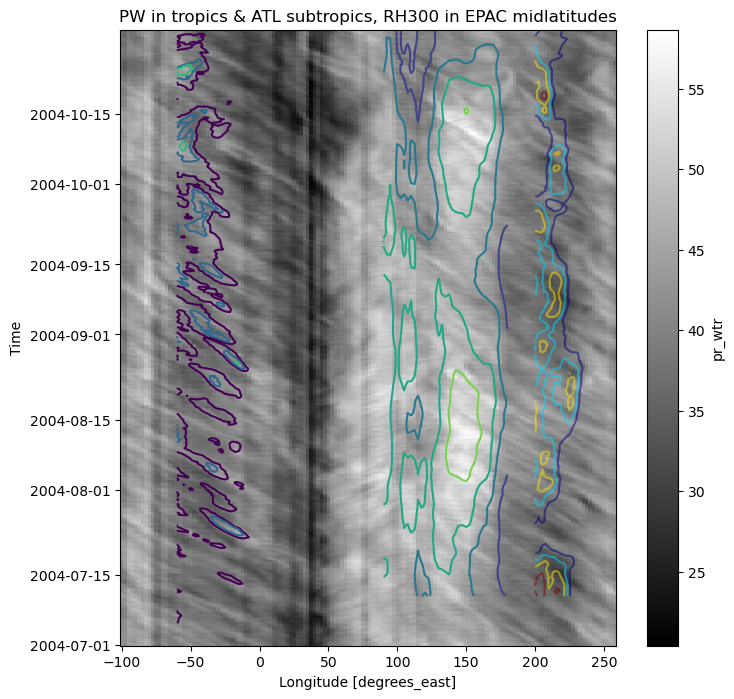

...

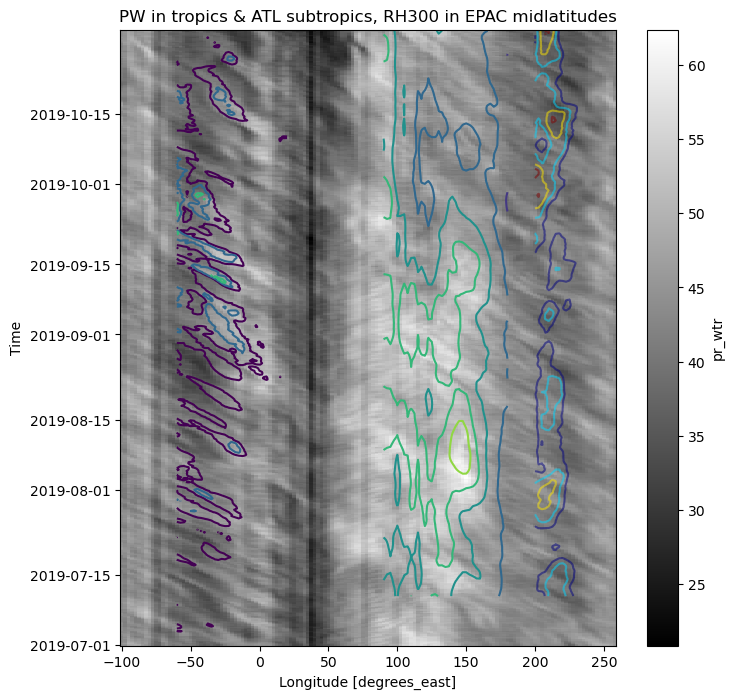

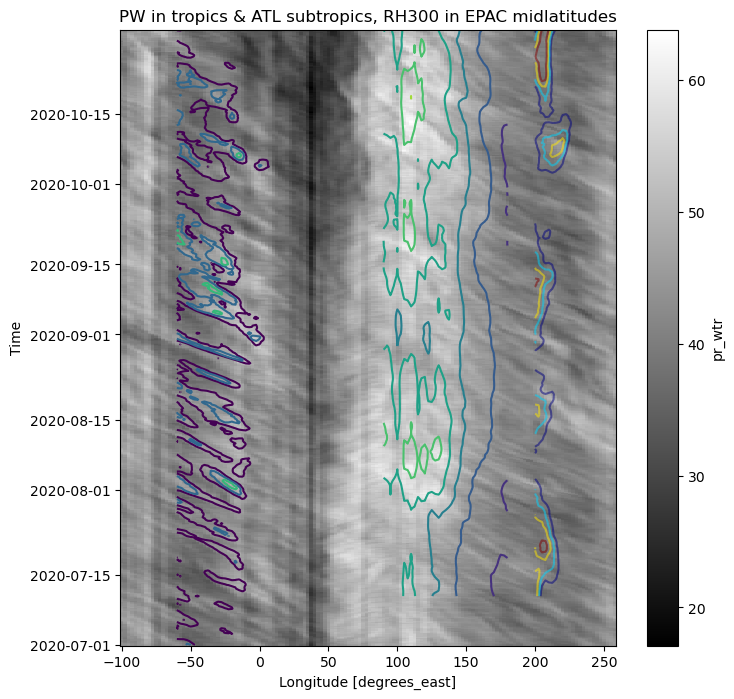

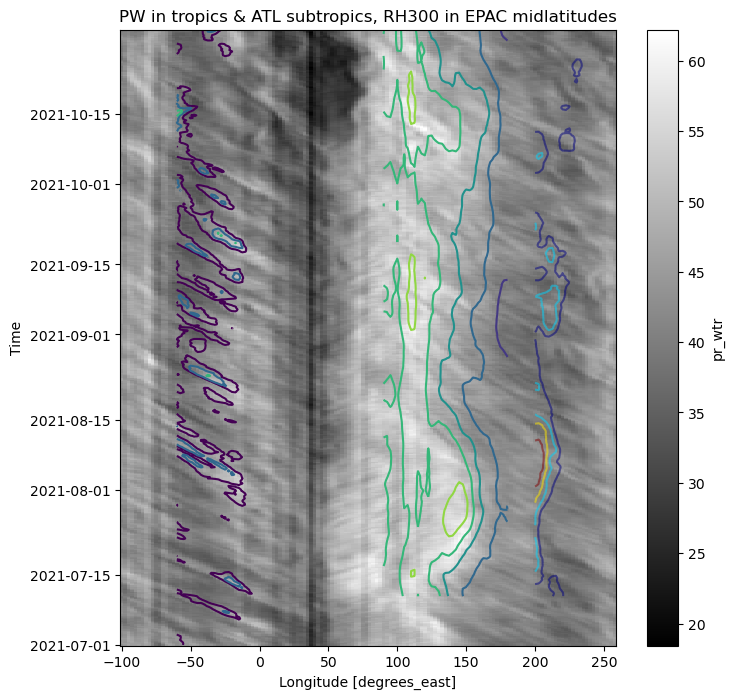

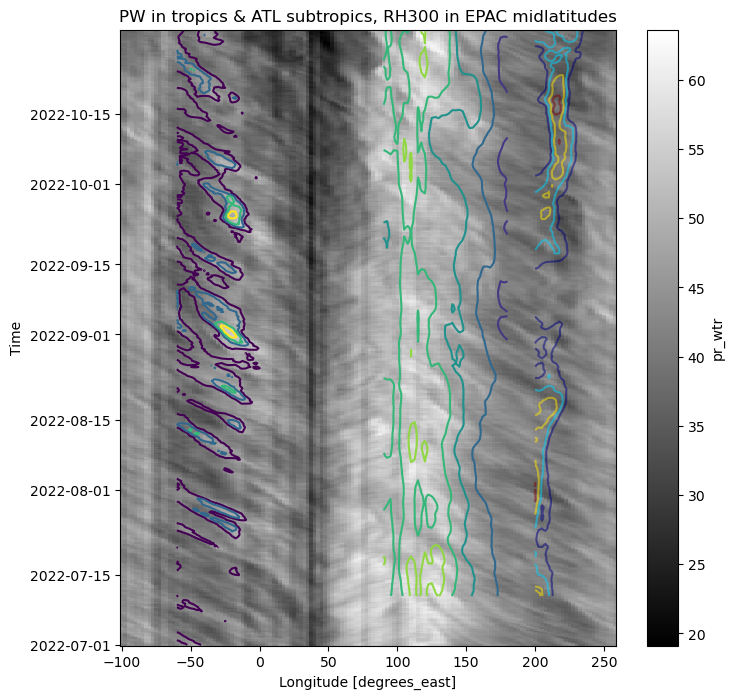

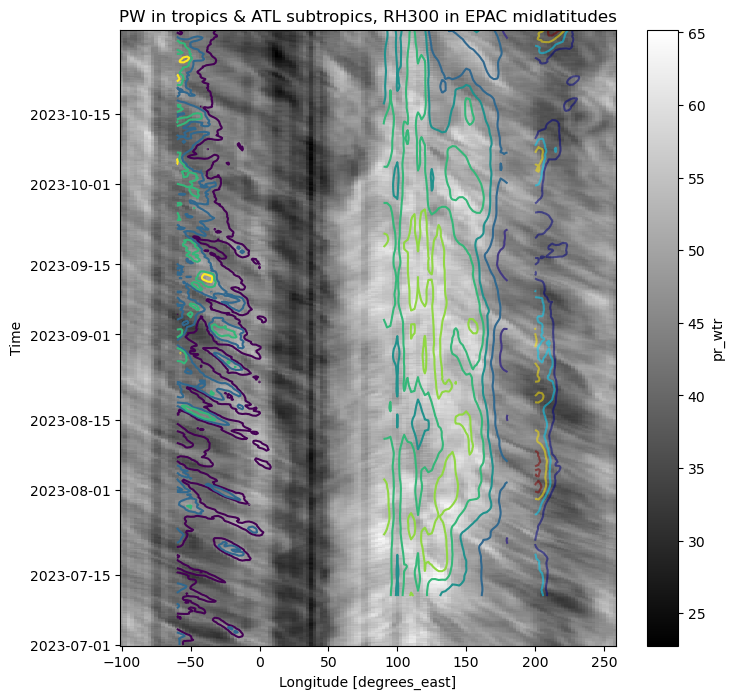

In [208]:
for year in years: 
    print(year)
    yyyy1 = str(year)+'-'
    yyyy2 = str(year)+'-'

    slab = ds[fields].sel(time = slice(yyyy+mm1+dd1, yyyy+mm2+dd2), lat = slice(latN, latS), level=mylevel)
    timelon = slab.mean('lat')  #.plot(size=7, aspect=0.5)


    # Plot background in gray scales: 

    PW_tropics = dsPW.pr_wtr.sel(time = slice(yyyy1+mm1+dd1, yyyy2+mm2+dd2), lat = slice(20,0))
    dsPW_rolled = PW_tropics.roll(lon=NumRollgrids, roll_coords=True)
    dsPW_rolled['lon'] = newlons
    tropicalPW = dsPW_rolled.mean('lat')
    tropicalPW.plot(cmap='gray',size=8,aspect=1)

    # Overplot time-smoothed version of same data 
    tropicalPW.rolling(time=40).mean().sel(lon=slice(90,180)).plot.contour()


    # Overplot PW in the Atlantic subtropics, have to roll longitude and pick 60W-20
    PW_subtropics = dsPW.pr_wtr.sel(time = slice(yyyy1+mm1+dd1, yyyy2+mm2+dd2), lat = slice(30,15))
    dsPW_rolled = PW_subtropics.roll(lon=NumRollgrids, roll_coords=True)
    dsPW_rolled['lon'] = newlons
    dsPW_rolled.sel(lon=slice(-60,20)).mean('lat').plot.contour(levels=[35,40,45,50])


    # Overplot PW in the EPAC midlatitudes (ARs)
    PW_midlats = dsPW.pr_wtr.sel(time = slice(yyyy1+mm1+dd1, yyyy2+mm2+dd2), lat = slice(60,30))
    #PW_midlats.sel(lon=slice(70,240)).mean('lat').plot.contour(levels=[30,35,40,45])

    # No actually, rh300 in midlatitudes 
    RH_midlats = ds.rhum.sel(time = slice(yyyy1+mm1+dd1, yyyy2+mm2+dd2), lat = slice(50,30), level=300)
    RHmid_smoo = RH_midlats.sel(lon=slice(200,240)).mean('lat').rolling(time=40).mean()
    RHmid_smoo.plot.contour(levels=[60,65,70,75], cmap='jet', alpha=0.5)

    plt.title('PW in tropics & ATL subtropics, RH300 in EPAC midlatitudes');

# Older RH300 plot, kept for perusal

2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020


/opt/miniconda3/envs/ATM651/lib/python3.10/site-packages/xarray/plot/utils.py:478: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  _, ax = plt.subplots(figsize=figsize, subplot_kw=subplot_kws)


2021
2022
2023


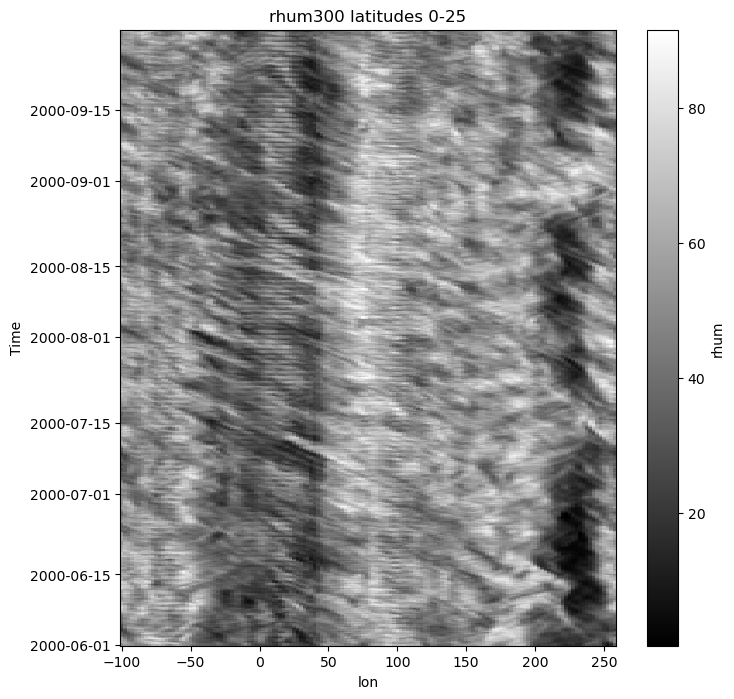

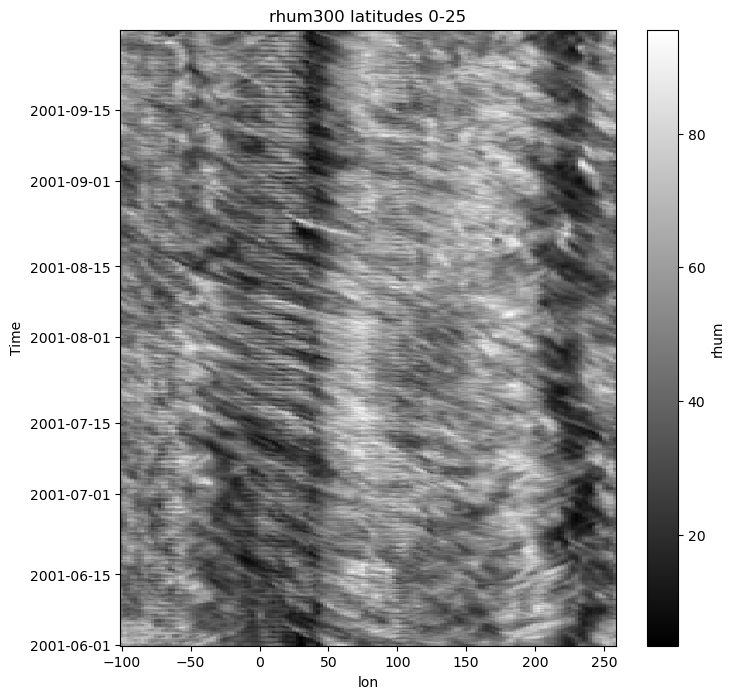

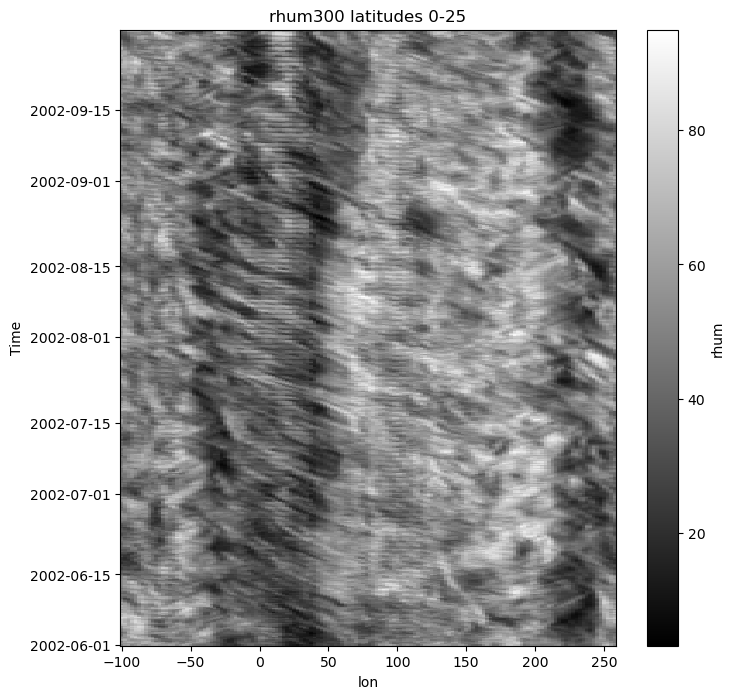

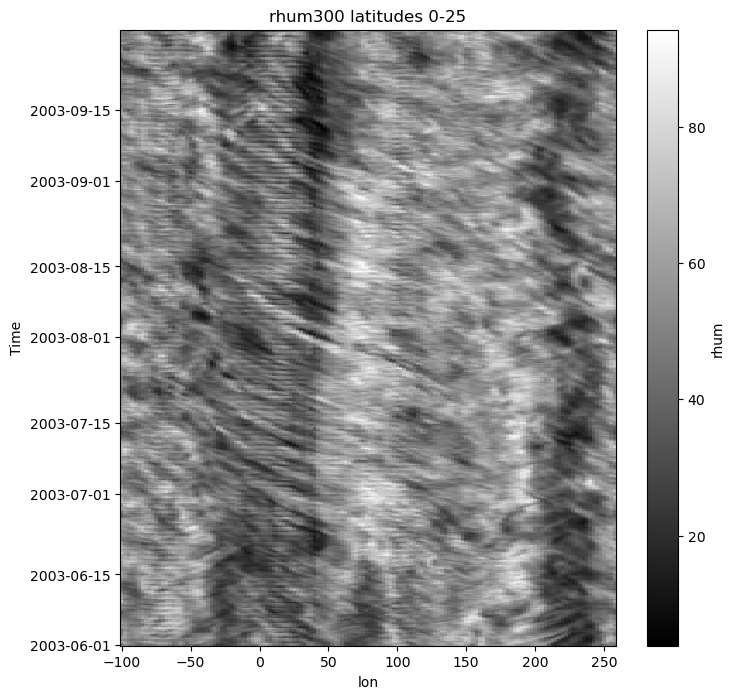

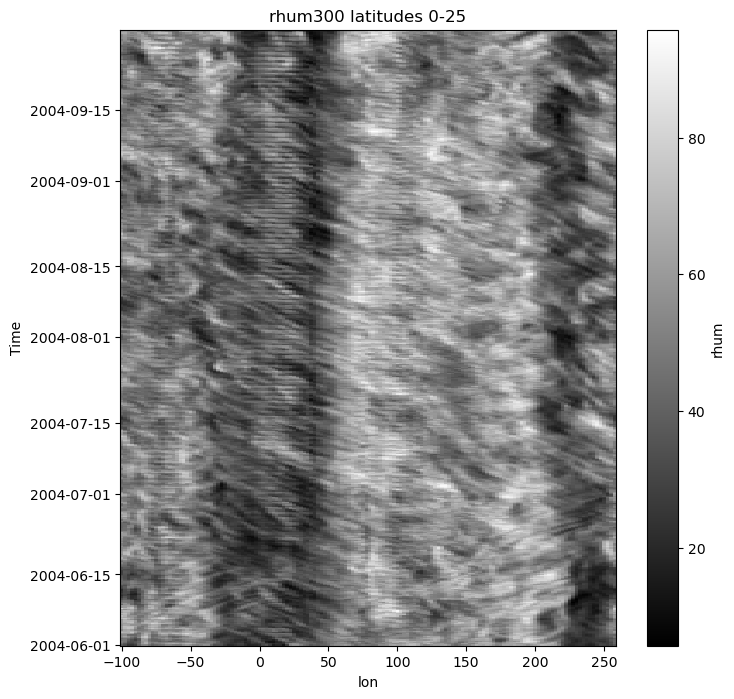

...

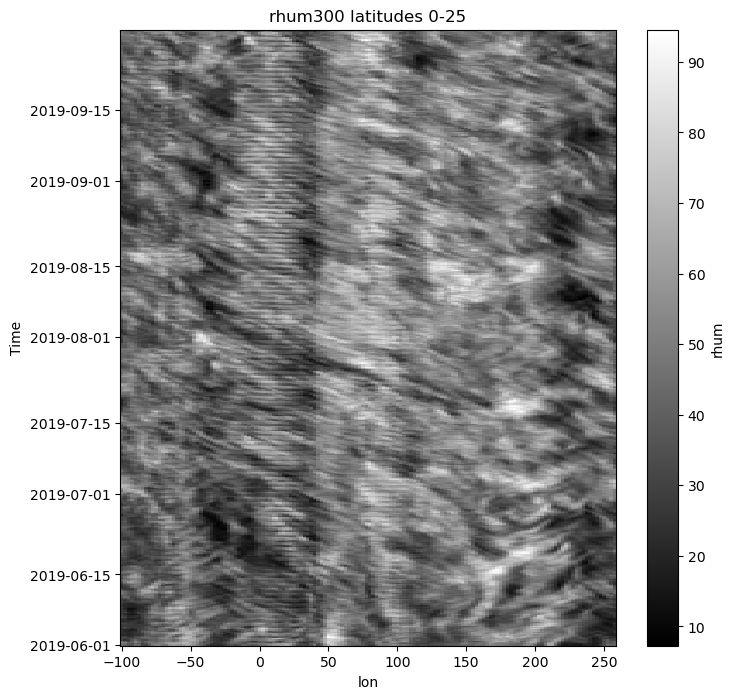

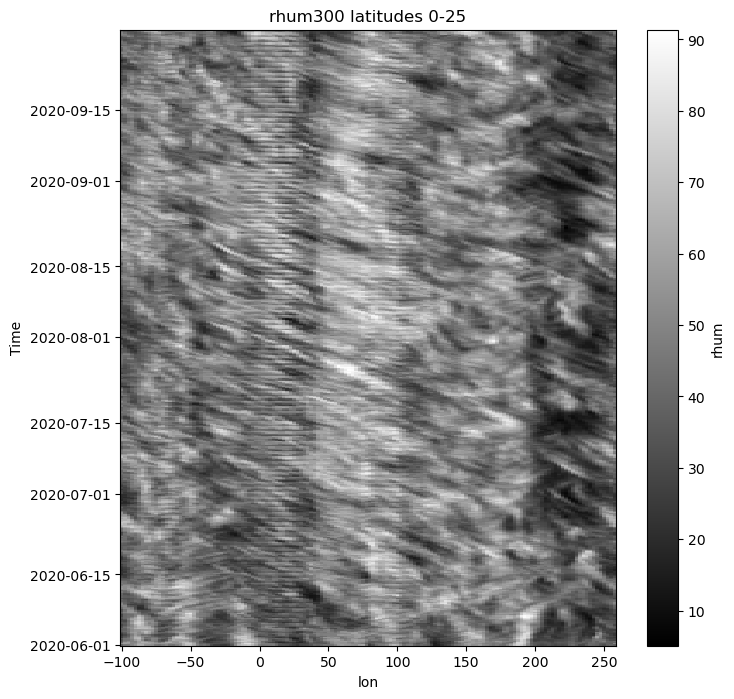

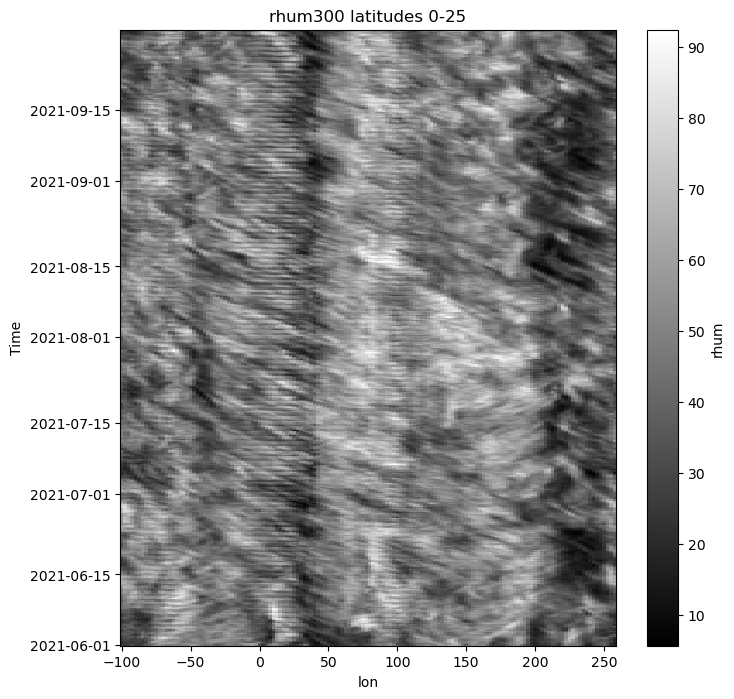

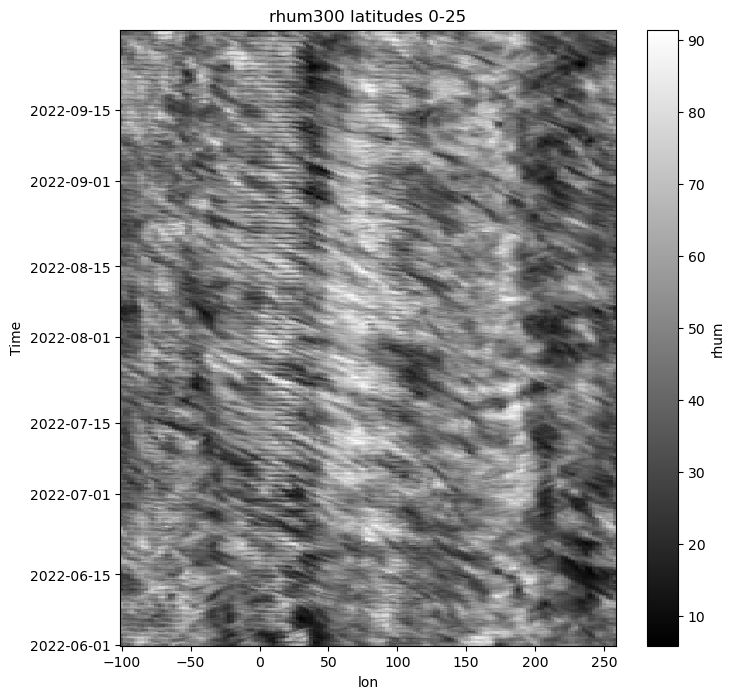

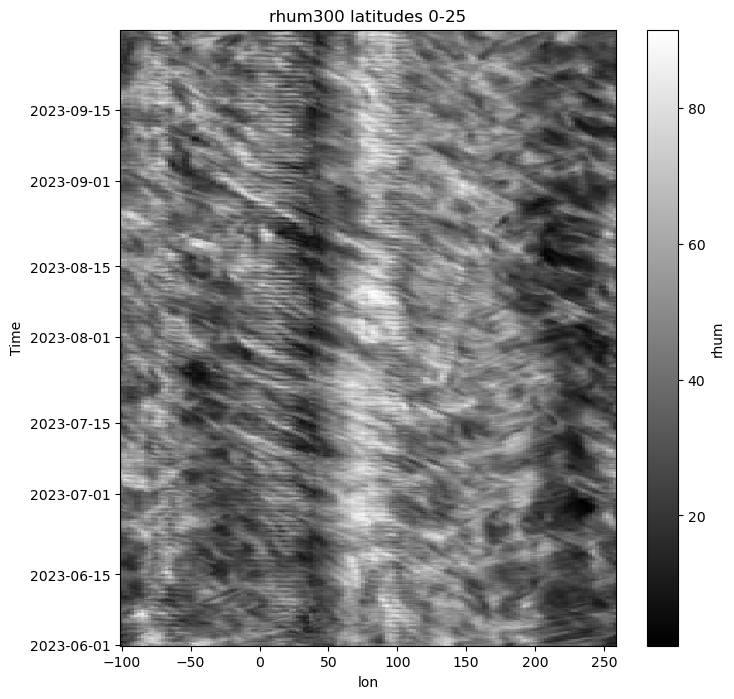

In [141]:
for year in years: 
    print(year)
    yyyy = str(year)+'-'
    
    slab = ds[fields].sel(time = slice(yyyy+mm1+dd1, yyyy+mm2+dd2), lat = slice(latN, latS), level=mylevel)
    timelon = slab.mean('lat')  #.plot(size=7, aspect=0.5)

# Roll the data to shift the longitude

    NumRollgrids = 40
    ds_rolled = timelon.roll(lon=NumRollgrids, roll_coords=True)

# Adjust the longitude coordinates, subtract 360 from the rolled ones

    leftlons = ds_rolled.lon[0:NumRollgrids].values -360
    ritelons = ds_rolled.lon[NumRollgrids:].values
    newlons = np.concatenate( (leftlons,ritelons) )
    ds_rolled['lon'] = newlons
    ds_rolled.rhum.plot(cmap='gray', size=8,aspect=1)
    plt.title('rhum300 latitudes '+str(latS)+'-'+str(latN));

# PW for atmospheric rivers 


<a id='NCEIgridsat'></a>

# NCEI catalog: all the satellite images 3-hourly since 1980! 
https://www.ncei.noaa.gov/thredds/catalog.html


In [16]:
# How about satellite imagery from gridsat? 
URL = 'https://www.ncei.noaa.gov/thredds/dodsC/cdr/gridsat_agg/GridSat_B1_Aggregation_best.ncd'
sat = xr.open_dataset(URL)
sat

# Gives errors, but also works sorta? 
#Dimensions:        (lat: 2000, lon: 5143, sparse2ir: 2, sparse2wv: 2,
#                    sparse2vs: 2, sparse3ir: 846374, time: 88221,
#                    time1: 121219, time_1: 1, Ngeo: 5)

<xarray.Dataset> Size: 44TB
Dimensions:        (lat: 2000, lon: 5143, sparse2ir: 2, sparse2wv: 2,
                    sparse2vs: 2, sparse3ir: 753202, time: 96261,
                    time1: 129259, time_1: 1, Ngeo: 5)
Coordinates:
  * lat            (lat) float32 8kB -70.0 -69.93 -69.86 ... 69.79 69.86 69.93
  * lon            (lon) float32 21kB -180.0 -179.9 -179.9 ... 179.8 179.9 179.9
  * sparse2ir      (sparse2ir) int32 8B 0 1
  * sparse2wv      (sparse2wv) int32 8B 0 1
  * sparse2vs      (sparse2vs) int32 8B 0 1
  * sparse3ir      (sparse3ir) int32 3MB 1041266 1041267 ... 9347184 9347185
  * time           (time) datetime64[ns] 770kB 1980-02-09T09:00:00 ... 2024-0...
    time_run       (time) datetime64[ns] 770kB ...
  * time1          (time1) datetime64[ns] 1MB 1980-01-01 ... 2024-03-31T21:00:00
    time1_run      (time1) datetime64[ns] 1MB ...
Dimensions without coordinates: time_1, Ngeo
Data variables: (12/27)
    satlat         (time_1, Ngeo) float32 20B ...
    satlon         (time_1, Ngeo) float32 20B ...
    satrad         (time_1, Ngeo) float32 20B ...
    satname        (time_1, Ngeo) |S64 320B ...
    b1ufile        (time_1, Ngeo) |S64 320B ...
    b1file         (time_1, Ngeo) |S64 320B ...
    ...             ...
    vschn          (time1, lat, lon) float32 5TB ...
    vschn_2        (time1, lat, lon) float32 5TB ...
    satid_ir       (time1, lat, lon) float32 5TB ...
    satid_wv       (time1, lat, lon) int8 1TB ...
    satid_vs       (time1, lat, lon) int8 1TB ...
    irwin_vza_adj  (time1, lat, lon) float32 5TB ...
Attributes: (12/56)
    title:                      GridSat-B1 - Gridded Satellite (GridSat) ISCC...
    summary:                    Geostationary data are remapped to equal angl...
    Conventions:                CF-1.4
    Metadata_Conventions:       CF-1.6, Unidata Dataset Discovery v1.0, NOAA ...
    references:                 http://dx.doi.org/10.1175/2011BAMS3039.1  htt...
    source:                     ISCCP.B1U.a.GOE-16.2024.03.31.1750.NOA,ISCCP....
    ...                         ...
    _CoordSysBuilder:           ucar.nc2.dataset.conv.CF1Convention
    featureType:                GRID
    location:                   Proto fmrc:GridSat_B1_Aggregation
    history:                    FMRC Best Dataset
    DODS.strlen:                50
    DODS.dimName:               StrLen

In [52]:
fred_day = sat.sel( lon=slice(-120,-50),lat=slice(20,50),time1=slice('2020-07-23-06','2020-07-24-00'))
fred_day

<xarray.Dataset>
Dimensions:        (lat: 429, lon: 1000, sparse2ir: 2, sparse2wv: 2,
                    sparse2vs: 2, sparse3ir: 761105, time: 94797, time1: 7,
                    time_1: 1, Ngeo: 5)
Coordinates:
  * lat            (lat) float32 20.02 20.09 20.16 20.23 ... 49.84 49.91 49.98
  * lon            (lon) float32 -119.9 -119.9 -119.8 ... -50.15 -50.08 -50.01
  * sparse2ir      (sparse2ir) int32 0 1
  * sparse2wv      (sparse2wv) int32 0 1
  * sparse2vs      (sparse2vs) int32 0 1
  * sparse3ir      (sparse3ir) int32 907527 907528 912669 ... 9259775 9259780
  * time           (time) datetime64[ns] 1980-02-09T09:00:00 ... 2023-09-30T2...
    time_run       (time) datetime64[ns] ...
  * time1          (time1) datetime64[ns] 2020-07-23T06:00:00 ... 2020-07-24
    time1_run      (time1) datetime64[ns] ...
Dimensions without coordinates: time_1, Ngeo
Data variables: (12/27)
    satlat         (time_1, Ngeo) float32 ...
    satlon         (time_1, Ngeo) float32 ...
    satrad         (time_1, Ngeo) float32 ...
    satname        (time_1, Ngeo) |S64 ...
    b1ufile        (time_1, Ngeo) |S64 ...
    b1file         (time_1, Ngeo) |S64 ...
    ...             ...
    vschn          (time1, lat, lon) float32 ...
    vschn_2        (time1, lat, lon) float32 ...
    satid_ir       (time1, lat, lon) float32 ...
    satid_wv       (time1, lat, lon) int8 ...
    satid_vs       (time1, lat, lon) int8 ...
    irwin_vza_adj  (time1, lat, lon) float32 ...
Attributes: (12/56)
    title:                      GridSat-B1 - Gridded Satellite (GridSat) ISCC...
    summary:                    Geostationary data are remapped to equal angl...
    Conventions:                CF-1.4
    Metadata_Conventions:       CF-1.6, Unidata Dataset Discovery v1.0, NOAA ...
    references:                 http://dx.doi.org/10.1175/2011BAMS3039.1  htt...
    source:                     ISCCP.B1U.a.GOE-16.2023.09.30.1750.NOA,ISCCP....
    ...                         ...
    _CoordSysBuilder:           ucar.nc2.dataset.conv.CF1Convention
    featureType:                GRID
    location:                   Proto fmrc:GridSat_B1_Aggregation
    history:                    FMRC Best Dataset
    DODS.strlen:                50
    DODS.dimName:               StrLen

In [70]:
list(fred_day.keys())[0:16]

['satlat',
 'satlon',
 'satrad',
 'satname',
 'b1ufile',
 'b1file',
 'calslp_irwin',
 'caloff_irwin',
 'calslp_irwvp',
 'caloff_irwvp',
 'vis_rad_slope',
 'vis_dc_slope',
 'vis_dc_offset',
 'satid_ir3',
 'time_offset',
 'time1_offset']

In [79]:
imagery = fred_day.drop_vars( list(fred_day.keys())[0:16] )
IRonly = imagery.drop_vars( list(imagery.keys())[1:] )
IRonly.to_netcdf('~/Downloads/FredIR.nc')

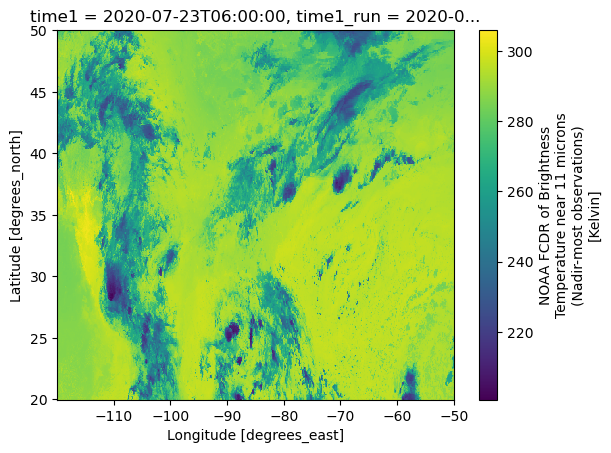

In [49]:
sat.sel(lon=slice(-120,-50),lat=slice(20,50), time1='2020-07-23-06').irwin_cdr.plot()

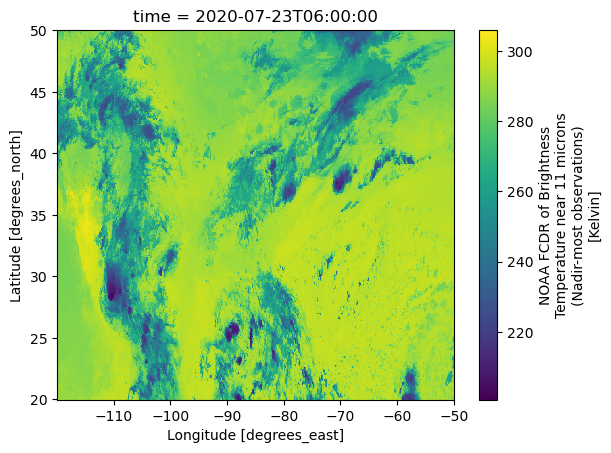

In [34]:
# Single Year GridSat file
URL = 'https://www.ncei.noaa.gov/thredds/dodsC/cdr/gridsat/2020/GRIDSAT-B1.2020.07.23.06.v02r01.nc'
ds = xr.open_dataset(URL)
ds.sel(lon=slice(-120,-50),lat=slice(20,50)).irwin_cdr.plot()

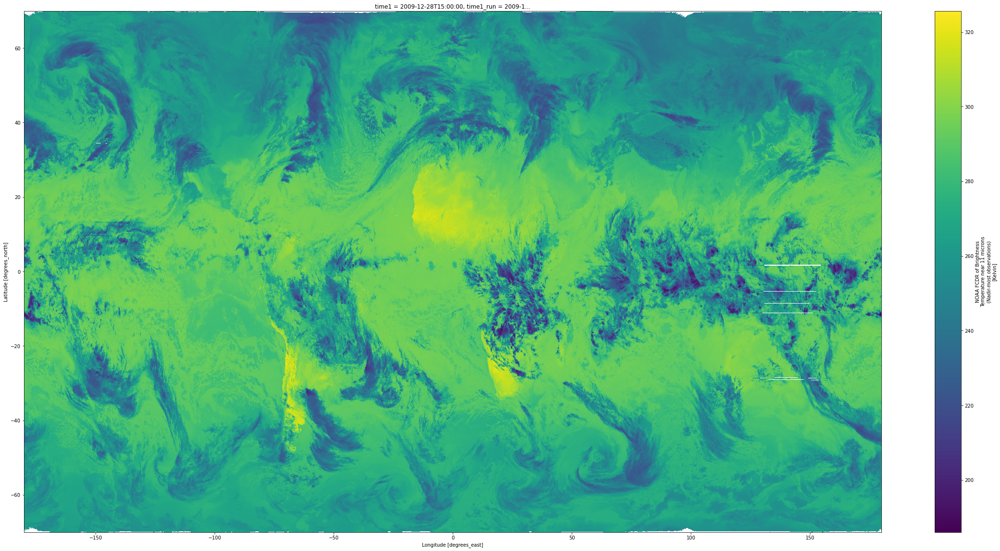

In [21]:
# 30 years into the dataset: 
ds.irwin_cdr[365*8*30].plot(size=20,aspect=2)

In [15]:
# Daily summaries of ISCCP satellite data 

testURL = 'https://www.ncei.noaa.gov/thredds/dodsC/cdr/isccp_hgh_agg/ISCCP-H_Aggregation_Basic_Gridded_By_Hour_(HGH)_best.ncd'
ISCCPH = xr.open_dataset(testURL)
ISCCPH

<xarray.Dataset> Size: 21GB
Dimensions:             (lon: 360, lat: 180, time: 3264, satpos: 12, edge: 2,
                         cldbin: 10, cloud_irtype: 3, cloud_type: 18,
                         time_1: 1, bounds_dim: 2)
Coordinates:
  * lon                 (lon) float32 1kB 0.5 1.5 2.5 3.5 ... 357.5 358.5 359.5
  * lat                 (lat) float32 720B -89.5 -88.5 -87.5 ... 87.5 88.5 89.5
  * time                (time) datetime64[ns] 26kB 1983-07-31 ... 2017-06-30T...
    time_run            (time) datetime64[ns] 26kB ...
Dimensions without coordinates: satpos, edge, cldbin, cloud_irtype, cloud_type,
                                time_1, bounds_dim
Data variables: (12/46)
    satcodes            (satpos) int16 24B ...
    satids              (satpos) |S64 768B ...
    satnames            (satpos) |S64 768B ...
    lon_bounds          (lon, edge) float32 3kB ...
    lat_bounds          (lat, edge) float32 1kB ...
    cldbin_bounds       (cldbin, edge) int32 80B ...
    ...                  ...
    tau_ir              (time, lat, lon) float32 846MB ...
    sigma_tau_space     (time, lat, lon) float32 846MB ...
    wp_ir               (time, lat, lon) float32 846MB ...
    sigma_wp_space      (time, lat, lon) float32 846MB ...
    cldamt_irmarg       (time, lat, lon) float32 846MB ...
    snoice              (time, lat, lon) float32 846MB ...
Attributes: (12/71)
    Conventions:                              CF-1.4, ACDD-1.3
    summary:                                  The HGH product represents hour...
    keywords:                                 EARTH SCIENCE > ATMOSPHERE > AT...
    keywords_vocabulary:                      NASA Global Change Master Direc...
    platform_vocabulary:                      NASA Global Change Master Direc...
    instrument_vocabulary:                    NASA Global Change Master Direc...
    ...                                       ...
    NCO:                                      netCDF Operators version 4.7.5 ...
    _CoordSysBuilder:                         ucar.nc2.dataset.conv.CF1Conven...
    featureType:                              GRID
    location:                                 Proto fmrc:ISCCP-H_Aggregation_...
    DODS.strlen:                              80
    DODS.dimName:                             label_len

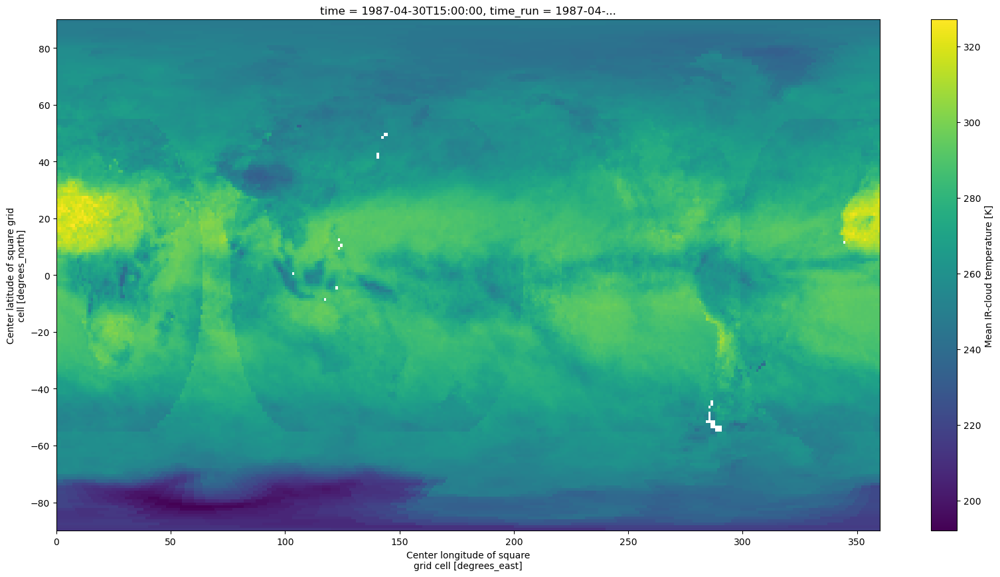

In [39]:
ISCCPH.tc_ir[365].plot(size=10,aspect=2)

In [48]:
# climatology of temperature: the January thaw? 

climT = xr.open_dataset('http://psl.noaa.gov/thredds/dodsC/Datasets/ncep.reanalysis.derived/surface/air.day.ltm.nc', decode_times=False)
climT

<xarray.Dataset>
Dimensions:             (lat: 73, lon: 144, time: 365, nbnds: 2)
Coordinates:
  * lat                 (lat) float32 90.0 87.5 85.0 82.5 ... -85.0 -87.5 -90.0
  * lon                 (lon) float32 0.0 2.5 5.0 7.5 ... 352.5 355.0 357.5
  * time                (time) float64 -1.577e+07 -1.577e+07 ... -1.576e+07
Dimensions without coordinates: nbnds
Data variables:
    climatology_bounds  (time, nbnds) float64 ...
    air                 (time, lat, lon) float32 ...
    valid_yr_count      (time, lat, lon) float32 ...
Attributes:
    Conventions:                    COARDS
    title:                          mean daily NMC reanalysis
    description:                    Data is from NMC initialized reanalysis\n...
    platform:                       Model
    history:                        Created 2021/07/26 by doDayLTMNC4
    dataset_title:                  NCEP-NCAR Reanalysis 1
    References:                     http://www.psl.noaa.gov/data/gridded/data...
    not_missing_threshold_percent:  minimum 3% values input to have non-missi...
    _NCProperties:                  version=2,netcdf=4.7.0,hdf5=1.10.5,

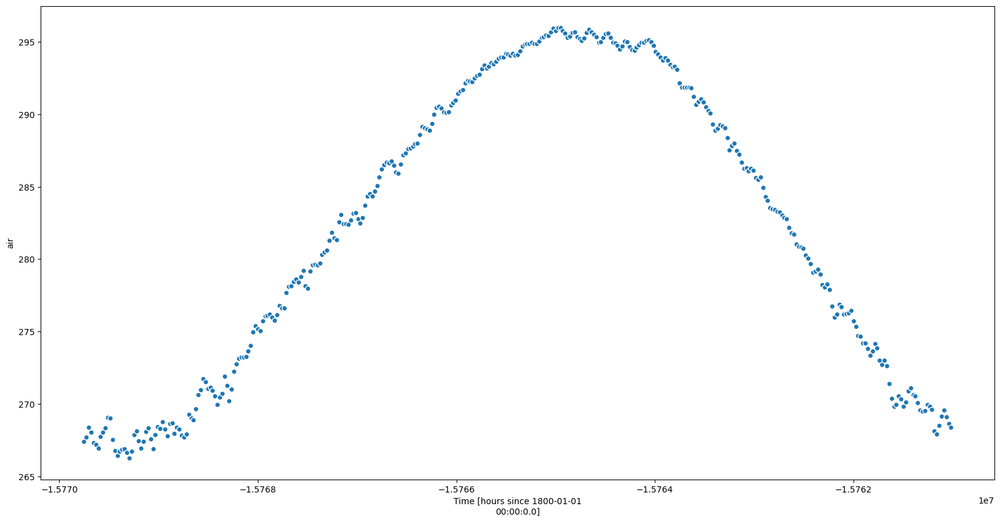

In [52]:
climT.sel(lat=slice(50,35),lon=slice(360-100,360-80)).mean(dim=['lat','lon']).air.plot.scatter(size=10,aspect=2)